In [27]:
import pandas as pd
import numpy as np

In [28]:
data = pd.read_csv('./Data/historical_weather.csv')
data.head()

,city_id,date,avg_temp_c,min_temp_c,max_temp_c,precipitation_mm,snow_depth_mm,avg_wind_dir_deg,avg_wind_speed_kmh
0,C001,2014-01-01,6.6,-1.4,11.6,NaN,NaN,168.0,6.2
1,C001,2014-01-02,9.3,6.3,13.3,NaN,NaN,155.0,10.0
2,C001,2014-01-03,7.6,1.9,14.0,NaN,NaN,NaN,5.8
3,C001,2014-01-04,7.6,3.9,13.3,NaN,NaN,291.0,11.3
4,C001,2014-01-05,8.6,0.5,16.9,NaN,NaN,NaN,5.0


In [29]:
print(data.shape)

(182338, 9)


In [30]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 182338 entries, 0 to 182337
Data columns (total 9 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   city_id             182338 non-null  object 
 1   date                182338 non-null  object 
 2   avg_temp_c          181114 non-null  float64
 3   min_temp_c          176452 non-null  float64
 4   max_temp_c          174845 non-null  float64
 5   precipitation_mm    112594 non-null  float64
 6   snow_depth_mm       12238 non-null   float64
 7   avg_wind_dir_deg    146944 non-null  float64
 8   avg_wind_speed_kmh  159866 non-null  float64
dtypes: float64(7), object(2)
memory usage: 12.5+ MB


In [31]:
data.describe()

,avg_temp_c,min_temp_c,max_temp_c,precipitation_mm,snow_depth_mm,avg_wind_dir_deg,avg_wind_speed_kmh
count,181114.000000,176452.000000,174845.000000,112594.000000,12238.000000,146944.000000,159866.000000
mean,19.137516,14.627775,23.887261,3.679964,342.481696,175.650289,11.281875
std,9.902722,10.004998,10.446670,11.294167,1020.265388,105.435150,6.132884
min,-34.700000,-43.800000,-28.500000,0.000000,0.000000,0.000000,0.000000
25%,12.400000,7.500000,17.100000,0.000000,0.000000,83.000000,7.200000
50%,21.400000,16.200000,27.000000,0.000000,10.000000,178.000000,9.900000
75%,27.100000,23.300000,31.500000,2.300000,140.000000,266.000000,14.000000
max,41.900000,38.900000,49.100000,496.100000,7140.000000,360.000000,80.000000


### **Null Values**

In [32]:
data.isnull().sum()

city_id                    0
date                       0
avg_temp_c              1224
min_temp_c              5886
max_temp_c              7493
precipitation_mm       69744
snow_depth_mm         170100
avg_wind_dir_deg       35394
avg_wind_speed_kmh     22472
dtype: int64

In [33]:
# Parse the date column
data['date'] = pd.to_datetime(data['date'])
data['month'] = data['date'].dt.month
data['year'] = data['date'].dt.year
data['day'] = data['date'].dt.day

In [34]:
# Function to fill missing values with the mean for the same city and month
def fill_missing_by_group(df, column, method='mean'):
    return df[column].fillna(df.groupby(['city_id', 'month'])[column].transform('mean'))

In [35]:
# Fill missing values for temperatures and precipitation
data['avg_temp_c'] = fill_missing_by_group(data, 'avg_temp_c', method='mean')
data['min_temp_c'] = fill_missing_by_group(data, 'min_temp_c', method='mean')
data['max_temp_c'] = fill_missing_by_group(data, 'max_temp_c', method='mean')
data['precipitation_mm'] = fill_missing_by_group(data, 'precipitation_mm', method='mean')

In [36]:
# For snow depth, fill with median and then set remaining NaNs to 0 if appropriate
data['snow_depth_mm'] = fill_missing_by_group(data, 'snow_depth_mm', method='mean')
data['snow_depth_mm'].fillna(0, inplace=True)

C:\Users\kauad\AppData\Local\Temp\ipykernel_5688\3336322842.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['snow_depth_mm'].fillna(0, inplace=True)


In [37]:
# Function to fill missing wind direction with circular mean
def fill_missing_wind_dir(df):
    df['sin_wind_dir'] = np.sin(np.deg2rad(df['avg_wind_dir_deg']))
    df['cos_wind_dir'] = np.cos(np.deg2rad(df['avg_wind_dir_deg']))
    mean_sin = df.groupby(['city_id', 'month'])['sin_wind_dir'].transform('mean')
    mean_cos = df.groupby(['city_id', 'month'])['cos_wind_dir'].transform('mean')
    df['avg_wind_dir_deg'] = df['avg_wind_dir_deg'].fillna(np.rad2deg(np.arctan2(mean_sin, mean_cos)))
    return df.drop(columns=['sin_wind_dir', 'cos_wind_dir'])

data = fill_missing_wind_dir(data)

In [38]:
# Fill missing wind speed
data['avg_wind_speed_kmh'] = fill_missing_by_group(data, 'avg_wind_speed_kmh', method='mean')

In [39]:
# For precipitation, fill with median and then set remaining NaNs to 0 if appropriate
data['precipitation_mm'] = fill_missing_by_group(data, 'precipitation_mm', method='mean')
data['precipitation_mm'].fillna(0, inplace=True)

C:\Users\kauad\AppData\Local\Temp\ipykernel_5688\1671105871.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['precipitation_mm'].fillna(0, inplace=True)


In [40]:
data.isnull().sum()

city_id               0
date                  0
avg_temp_c            0
min_temp_c            0
max_temp_c            0
precipitation_mm      0
snow_depth_mm         0
avg_wind_dir_deg      0
avg_wind_speed_kmh    0
month                 0
year                  0
day                   0
dtype: int64

In [41]:
# Save to cleaned_historical_weather.csv
data.to_csv('./Data/historical_weather_cleaned.csv', index=False)

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt

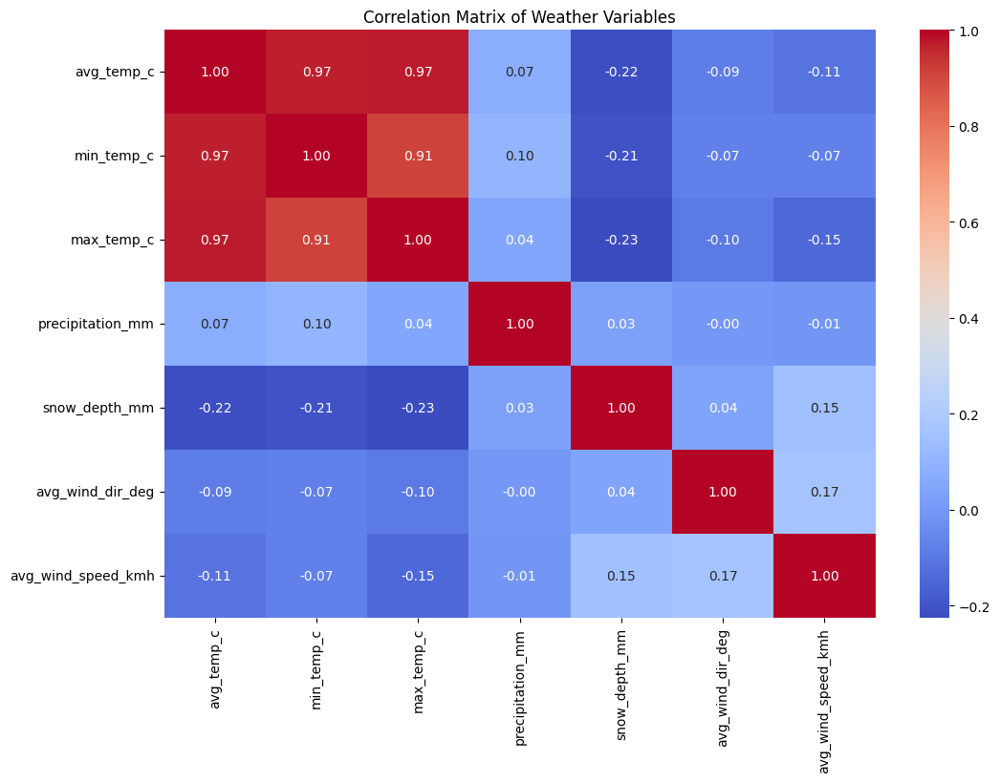

In [43]:
# Exclude non-numeric columns from correlation calculation
numeric_cols = data.select_dtypes(include=['float64', 'int64']).columns
data_numeric = data[numeric_cols]

# Calculate the correlation matrix
corr_matrix = data_numeric.corr()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Weather Variables')
plt.show()

In [44]:
# Check whether there are duplicates
duplicates = data.duplicated()
print('Number of duplicate rows = %d' % duplicates.sum())

Number of duplicate rows = 0


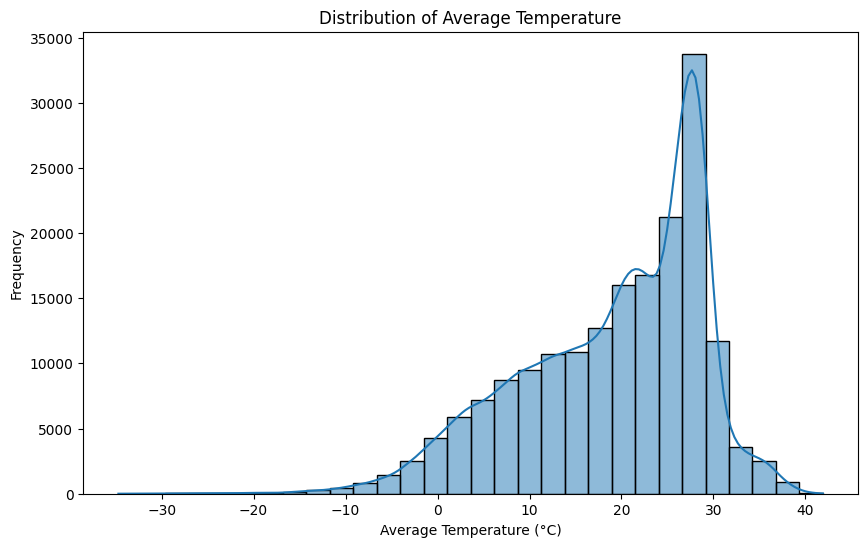

In [45]:
plt.figure(figsize=(10, 6))
sns.histplot(data['avg_temp_c'], bins=30, kde=True)
plt.title('Distribution of Average Temperature')
plt.xlabel('Average Temperature (°C)')
plt.ylabel('Frequency')
plt.show()

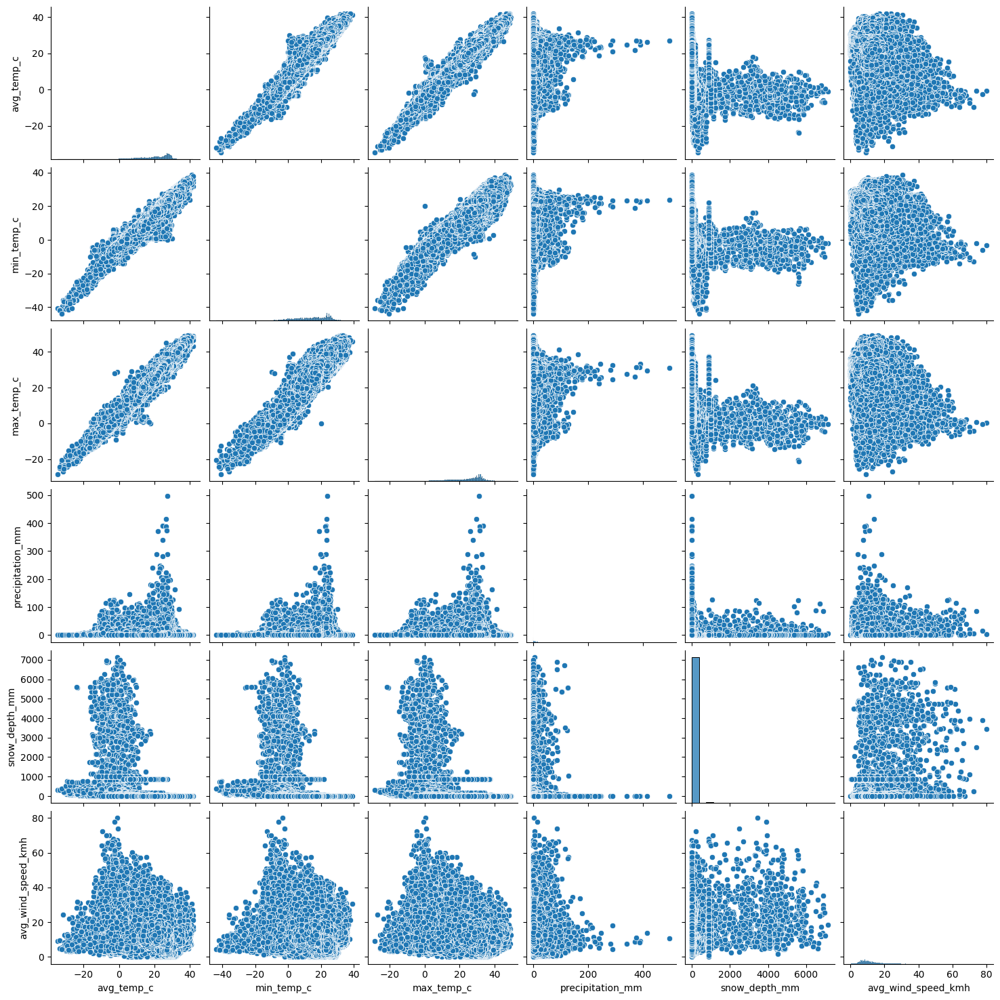

In [46]:
sns.pairplot(data[['avg_temp_c', 'min_temp_c', 'max_temp_c', 'precipitation_mm', 'snow_depth_mm', 'avg_wind_speed_kmh']])
plt.show()

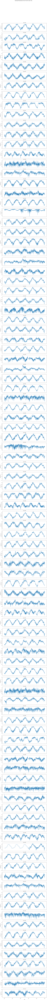

In [47]:
# Get unique city IDs
city_ids = data['city_id'].unique()

# Number of cities
num_cities = len(city_ids)

# Create a grid of subplots
fig, axes = plt.subplots(nrows=num_cities, ncols=1, figsize=(14, 3 * num_cities), sharex=True)
fig.suptitle('Average Temperature Over Time for Each City', fontsize=16)

# Plot each city's average temperature over time
for i, city_id in enumerate(city_ids):
    city_data = data[data['city_id'] == city_id]
    axes[i].plot(city_data['date'], city_data['avg_temp_c'])
    axes[i].set_title(f'City {city_id}')
    axes[i].set_ylabel('Avg Temp (°C)')
    axes[i].tick_params(axis='x', rotation=45)

# Set the x-axis label for the last subplot
axes[-1].set_xlabel('Date')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [48]:
weather_data = pd.read_csv('./Data/historical_weather_cleaned.csv')

In [49]:
# Check for February 29 rows
feb_29_rows = weather_data[(weather_data['month'] == 2) & (weather_data['day'] == 29)]

# Remove February 29 rows if any
cleaned_weather_data = weather_data.drop(feb_29_rows.index)

# Save the cleaned data to a new CSV file
cleaned_file_path = './Data/historical_weather_cleaned.csv'
cleaned_weather_data.to_csv(cleaned_file_path, index=False)

In [50]:
cleaned_weather_data = cleaned_weather_data[['city_id', 'date', 'avg_temp_c', 'min_temp_c', 'max_temp_c', 'month', 'year', 'day']]

cleaned_weather_data.head()

,city_id,date,avg_temp_c,min_temp_c,max_temp_c,month,year,day
0,C001,2014-01-01,6.6,-1.4,11.6,1,2014,1
1,C001,2014-01-02,9.3,6.3,13.3,1,2014,2
2,C001,2014-01-03,7.6,1.9,14.0,1,2014,3
3,C001,2014-01-04,7.6,3.9,13.3,1,2014,4
4,C001,2014-01-05,8.6,0.5,16.9,1,2014,5


In [51]:
# Add a column for the day of the year
cleaned_weather_data['day_of_year'] = pd.to_datetime(cleaned_weather_data['date']).dt.dayofyear

# Drop the now unnecessary columns
cleaned_weather_data = cleaned_weather_data[['city_id', 'date', 'avg_temp_c', 'min_temp_c', 'max_temp_c', 'day_of_year', 'year']]

cleaned_weather_data.head()

,city_id,date,avg_temp_c,min_temp_c,max_temp_c,day_of_year,year
0,C001,2014-01-01,6.6,-1.4,11.6,1,2014
1,C001,2014-01-02,9.3,6.3,13.3,2,2014
2,C001,2014-01-03,7.6,1.9,14.0,3,2014
3,C001,2014-01-04,7.6,3.9,13.3,4,2014
4,C001,2014-01-05,8.6,0.5,16.9,5,2014


In [52]:
# Save the cleaned data to a new CSV file
cleaned_weather_data.to_csv('./Data/historical_weather_cleaned_filtered.csv', index=False)